In [68]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn.preprocessing import LabelEncoder
from scipy.stats import skew, kurtosis

### 1. Data Collection

In [69]:
# Load the dataset
df = pd.read_csv("housing_data.csv")

In [70]:
# DataSet 
df.head()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,No,No,No,0,Dec,2008,WD,Normal,250000


In [71]:
df.tail()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Apr,2010,WD,Normal,142125
1459,1459,SC20,RL,75,9937,Pave,NaN,Reg,Lvl,AllPub,...,0,No,No,No,0,Jun,2008,WD,Normal,147500


### 2. Data Cleaning

In [72]:
# Show columns with missing values
missing = df.isnull().sum()
missing = missing[missing > 0].sort_values(ascending=False)
print(missing)

Alley          1369
MasVnrType      872
GarageYrBlt      81
Electrical        1
dtype: int64


In [73]:
# # Drop columns with more than 80% missing values
drop_cols = missing[missing > 0.8 * len(df)].index.tolist()
print("drop columns",drop_cols)
df.drop(columns=drop_cols, inplace=True)
print(df.columns.tolist())

drop columns ['Alley']
['Unnamed: 0', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch'

In [74]:
#drop propert Id
df = df.drop('Unnamed: 0',axis=1)

In [75]:
# # Fill numeric columns with mean
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
print(num_cols)
for col in num_cols:
    if df[col].isnull().sum() > 0:
        df[col].fillna(df[col].mean(), inplace=True)

['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'YrSold', 'SalePrice']


C:\Users\mohan\AppData\Local\Temp\ipykernel_21876\3252248368.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mean(), inplace=True)


In [76]:
# # Fill categorical columns with mode
cat_cols = df.select_dtypes(include=['object']).columns.tolist()
print(cat_cols)
for col in cat_cols:
    if df[col].isnull().sum() > 0:
        df[col].fillna(df[col].mode()[0], inplace=True)

['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'MoSold', 'SaleType', 'SaleCondition']


C:\Users\mohan\AppData\Local\Temp\ipykernel_21876\3215846245.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mode()[0], inplace=True)


In [77]:
# # Confirm all missing values handled
print("✅ Missing values after cleaning:", df.isnull().sum().sum())

✅ Missing values after cleaning: 0


In [78]:
# DataSet 
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,SC60,RL,65,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,SC20,RL,80,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,No,No,No,0,May,2007,WD,Normal,181500
2,SC60,RL,68,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,SC70,RL,60,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,SC60,RL,84,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,No,No,No,0,Dec,2008,WD,Normal,250000


### 3. Univariate Analysis

In [79]:
df['YrSold'].unique()

array([2008, 2007, 2006, 2009, 2010], dtype=int64)

In [80]:
df_2008 = df.loc[df['YrSold']==2008]
df_2008[['YrSold','SalePrice']].head()

,YrSold,SalePrice
0,2008,208500
2,2008,223500
4,2008,250000
8,2008,129900
9,2008,118000


In [81]:
df_2007 = df.loc[df['YrSold']==2007]
df_2006 = df.loc[df['YrSold']==2006]
df_2009 = df.loc[df['YrSold']==2009]
df_2010 = df.loc[df['YrSold']==2010]

<!-- import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Sample DataFrame with multiple categorical columns
data = {
    'Neighborhood': ['CollgCr', 'Veenker', 'CollgCr', 'Crawfor', 'NoRidge'],
    'HouseStyle': ['2Story', '1Story', '2Story', '2Story', '1Story'],
    'SaleCondition': ['Normal', 'Abnorml', 'Normal', 'Partial', 'Abnorml']
}

df = pd.DataFrame(data)

# Initialize an empty dictionary to store LabelEncoders
label_encoders = {}

# Loop through each column to encode
for col in df.columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Store encoder for possible inverse_transform later

print(df) -->


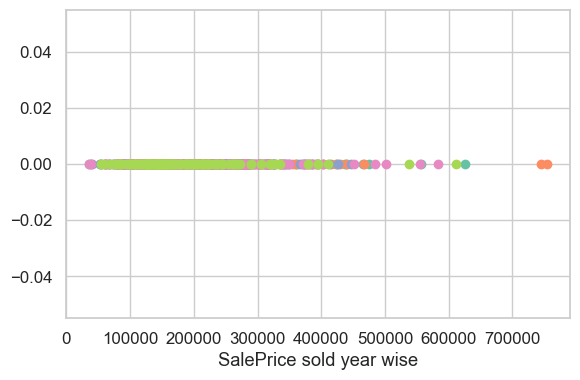

In [82]:

plt.figure(figsize=(6, 4))
# plt.plot(df['SalePrice'], np.zeros_like(df['SalePrice']),'o')
plt.plot(df_2006['SalePrice'], np.zeros_like(df_2006['SalePrice']),'o')
plt.plot(df_2007['SalePrice'], np.zeros_like(df_2007['SalePrice']),'o')
plt.plot(df_2008['SalePrice'], np.zeros_like(df_2008['SalePrice']),'o')
plt.plot(df_2009['SalePrice'], np.zeros_like(df_2009['SalePrice']),'o')
plt.plot(df_2010['SalePrice'], np.zeros_like(df_2010['SalePrice']),'o')
plt.xlabel('SalePrice sold year wise')
plt.tight_layout()
plt.show()

In [83]:
# Set Seaborn style
sns.set(style="whitegrid")

# Get all column names
all_cols = df.columns.tolist()
n_cols = 6  # Number of plots per row
n_plots = len(all_cols)
n_rows = math.ceil(n_plots / n_cols)

# Set figure size
plt.figure(figsize=(12 * n_cols, 8 * n_rows))

# Loop through all columns
for i, col in enumerate(all_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    
    if pd.api.types.is_numeric_dtype(df[col]):
        # Plot numeric data
        sns.histplot(df[col].dropna(), kde=True, bins=30, color='skyblue')
    else:
        # Plot categorical data
        sns.countplot(x=col, data=df)
        plt.xticks(rotation=45, ha='right')
    plt.title(f'Distribution of {col}', fontsize=12)
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


### 4. Bivariate Analysis

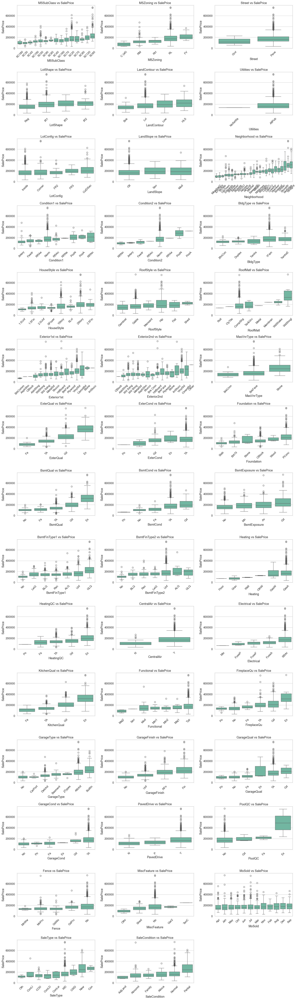

In [84]:
# Set Seaborn style
sns.set(style="whitegrid", palette="Set2", font_scale=1.1)

# Get all categorical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

# Grid setup
n_cols = 3  # Number of plots per row (you can change this)
n_plots = len(categorical_cols)
n_rows = math.ceil(n_plots / n_cols)

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 4))
axes = axes.flatten()  # Flatten 2D array of axes for easy looping

# Plot boxplots
for i, col in enumerate(categorical_cols):
    ax = axes[i]
    order = df.groupby(col)['SalePrice'].median().sort_values().index
    sns.boxplot(data=df, x=col, y='SalePrice', order=order, ax=ax)
    ax.set_title(f"{col} vs SalePrice")
    ax.tick_params(axis='x', rotation=45)

# Hide any extra axes
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### 5. Multivariate Analysis

In [85]:
# Initialize LabelEncoder
le = LabelEncoder()

# Loop through each column
for col in df.columns:
    # Step 1: Check if column is non-numeric
    if df[col].dtype == 'object' or df[col].dtype.name == 'category':
        # Step 2: Apply LabelEncoder
        df[col] = le.fit_transform(df[col])


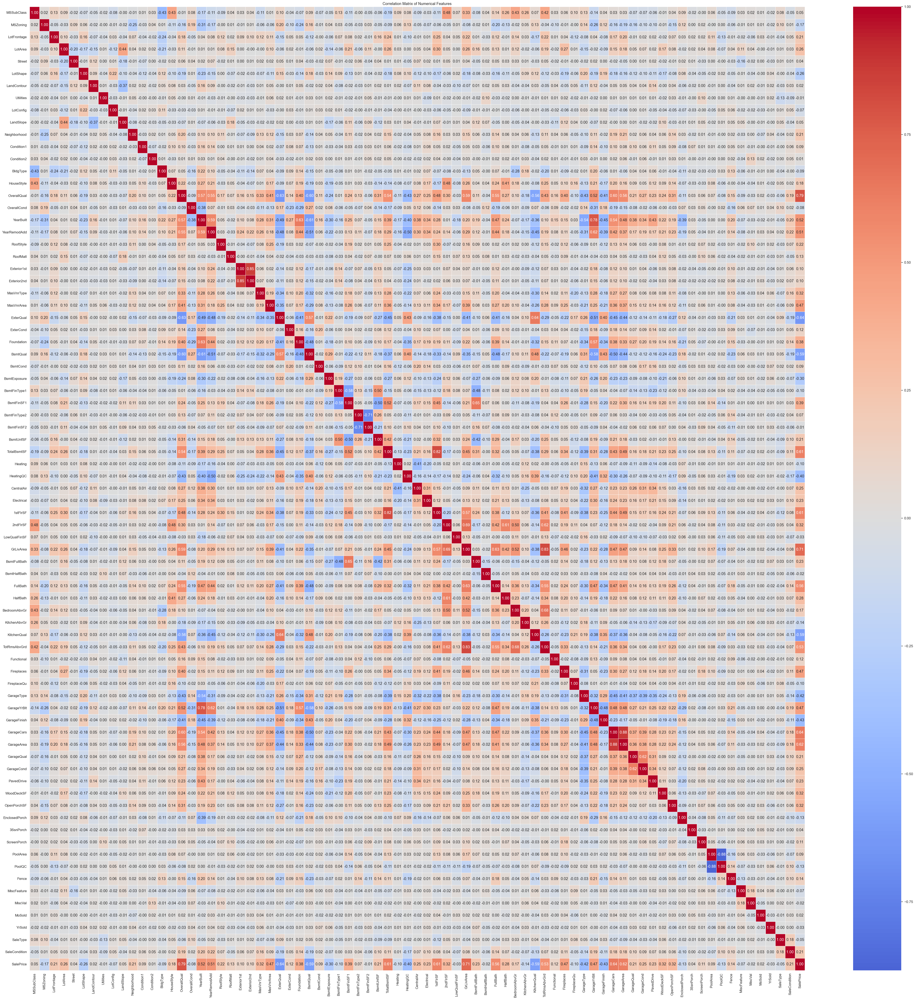

In [86]:
# Compute correlation matrix
correlation_matrix = df.corr()

# Plot heatmap of correlations
plt.figure(figsize=(60, 60))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", center=0, linewidths=0.5)
plt.title("Correlation Matrix of Numerical Features")
plt.show()



C:\Users\mohan\AppData\Local\Temp\ipykernel_21876\2400818724.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_corr.values, y=top_corr.index, palette="viridis")


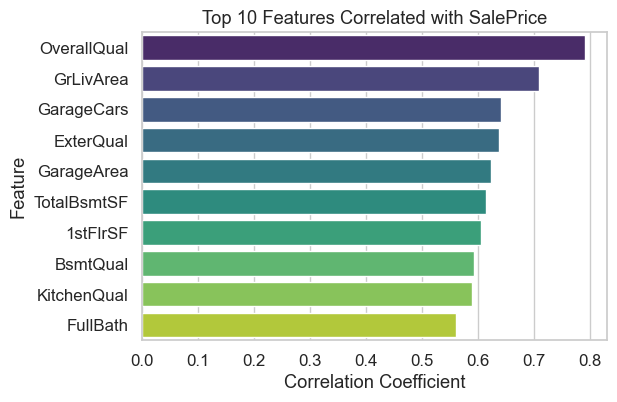

In [87]:
# ---------- 2. Correlation with SalePrice ----------
# Get top correlations with SalePrice
top_corr = correlation_matrix['SalePrice'].abs().sort_values(ascending=False)[1:11]  # exclude itself

# Plot top correlated features with SalePrice
plt.figure(figsize=(6, 4))
sns.barplot(x=top_corr.values, y=top_corr.index, palette="viridis")
plt.title("Top 10 Features Correlated with SalePrice")
plt.xlabel("Correlation Coefficient")
plt.ylabel("Feature")
plt.show()

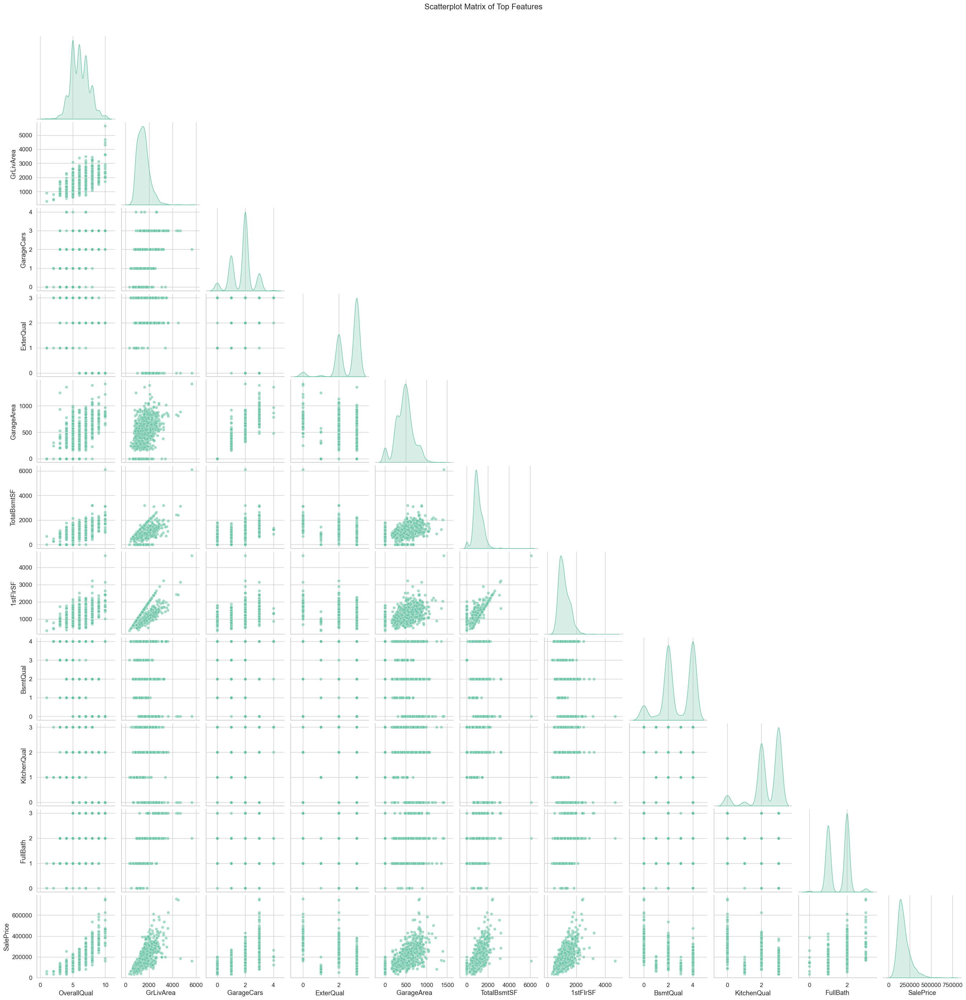

In [88]:
# ---------- 3. Scatterplot Matrix ----------
# Select top features for scatter matrix
top_features = top_corr.index.tolist() + ['SalePrice']
sns.pairplot(df[top_features], corner=True, diag_kind='kde', plot_kws={'alpha':0.6})
plt.suptitle("Scatterplot Matrix of Top Features", y=1.02)
plt.show()


### 6.Feature Engineering

In [89]:
# 1. Price per square foot
df['PricePerSqFt'] = df['SalePrice'] / df['GrLivArea']

# 2. House age at time of sale
df['HouseAge'] = df['YrSold'] - df['YearBuilt']

# 3. Age since last remodel
df['RemodAge'] = df['YrSold'] - df['YearRemodAdd']

# 4. Total bathrooms (including basement)
df['TotalBathrooms'] = (
    df['FullBath'] + 0.5 * df['HalfBath'] +
    df['BsmtFullBath'] + 0.5 * df['BsmtHalfBath']
)

# 5. Total porch square footage
df['TotalPorchSF'] = (
    df['OpenPorchSF'] + df['EnclosedPorch'] +
    df['3SsnPorch'] + df['ScreenPorch']
)

# 6. Total square footage of house
df['TotalSF'] = (
    df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']
)

# Preview new features
print(df[['SalePrice', 'GrLivArea', 'PricePerSqFt', 'HouseAge', 'RemodAge', 'TotalBathrooms', 'TotalPorchSF', 'TotalSF']].head())


   SalePrice  GrLivArea  PricePerSqFt  HouseAge  RemodAge  TotalBathrooms  \
0     208500       1710    121.929825         5         5             3.5   
1     181500       1262    143.819334        31        31             2.5   
2     223500       1786    125.139978         7         6             3.5   
3     140000       1717     81.537566        91        36             2.0   
4     250000       2198    113.739763         8         8             3.5   

   TotalPorchSF  TotalSF  
0            61     2566  
1             0     2524  
2            42     2706  
3           307     2473  
4            84     3343  


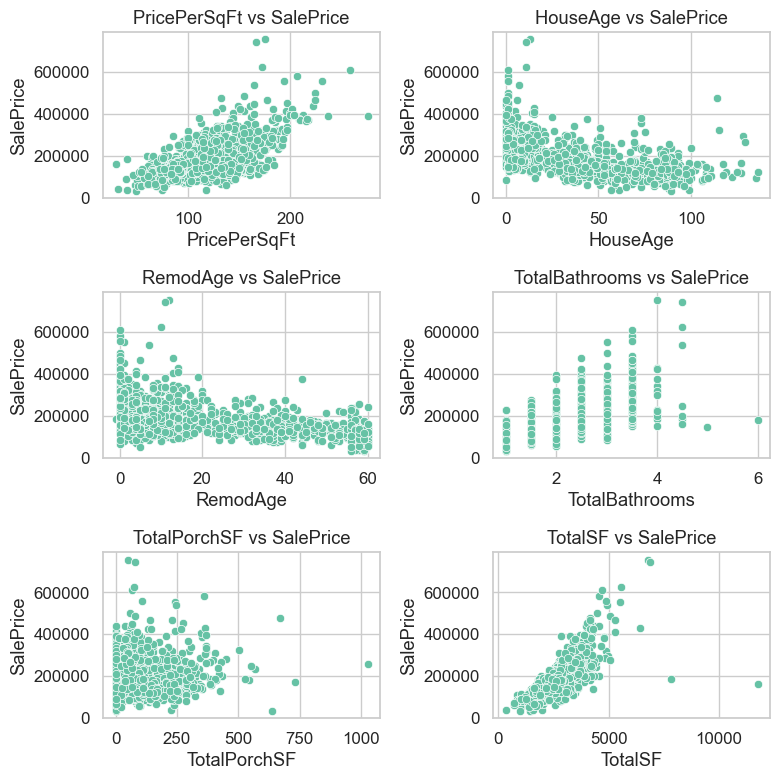

SalePrice         1.000000
TotalSF           0.782260
TotalBathrooms    0.631731
PricePerSqFt      0.575505
TotalPorchSF      0.195739
RemodAge         -0.509079
HouseAge         -0.523350
Name: SalePrice, dtype: float64


In [90]:
# Scatter plots for new features vs SalePrice
features = ['PricePerSqFt', 'HouseAge', 'RemodAge', 'TotalBathrooms', 'TotalPorchSF', 'TotalSF']

plt.figure(figsize=(8, 8))
for i, feature in enumerate(features, 1):
    plt.subplot(3, 2, i)
    sns.scatterplot(data=df, x=feature, y='SalePrice')
    plt.title(f'{feature} vs SalePrice')
    plt.tight_layout()

plt.show()
# Correlation of new features with SalePrice
correlation = df[['SalePrice', 'PricePerSqFt', 'HouseAge', 'RemodAge', 'TotalBathrooms', 'TotalPorchSF', 'TotalSF']].corr()
print(correlation['SalePrice'].sort_values(ascending=False))


### 7. Feature Engineering and Size Impact

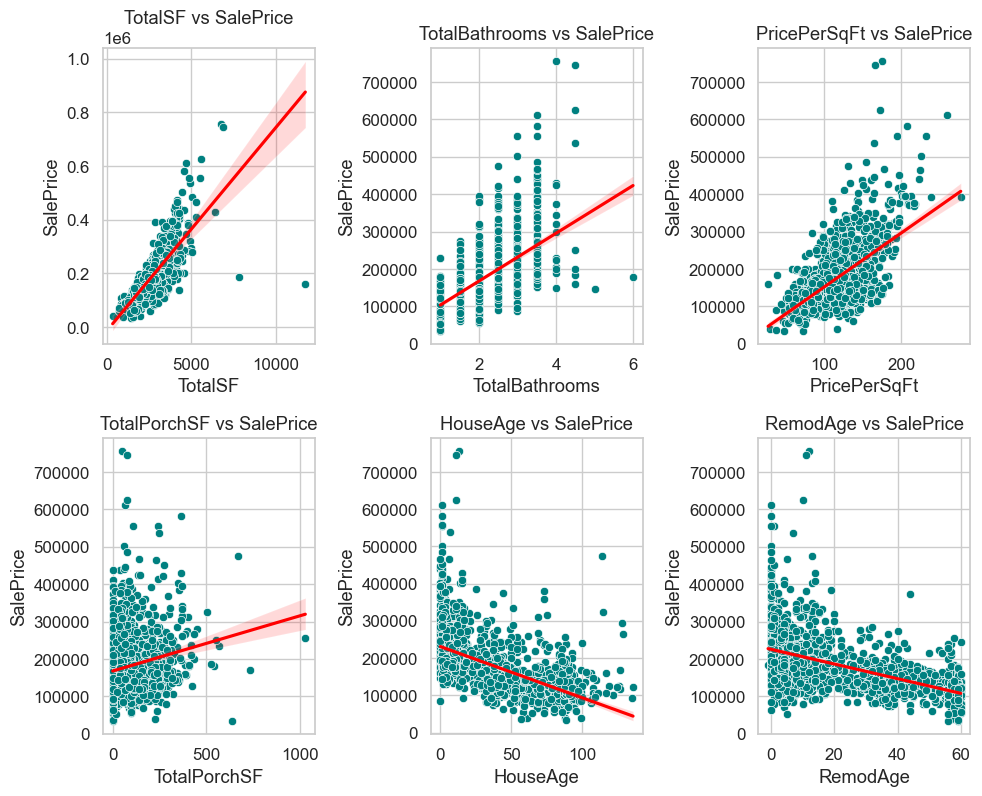

In [91]:
# Features to visualize against SalePrice
features = ['TotalSF', 'TotalBathrooms', 'PricePerSqFt', 'TotalPorchSF', 'HouseAge', 'RemodAge']

plt.figure(figsize=(10, 8))
for i, feature in enumerate(features, 1):
    plt.subplot(2, 3, i)
    sns.scatterplot(data=df, x=feature, y='SalePrice', color='teal')
    sns.regplot(data=df, x=feature, y='SalePrice', scatter=False, color='red')
    plt.title(f'{feature} vs SalePrice')

plt.tight_layout()
plt.show()


### 8.Market Trends and Historical Pricing

In [92]:
print(df['MoSold'])

0        3
1        8
2       11
3        3
4        2
        ..
1455     1
1456     3
1457     8
1458     0
1459     6
Name: MoSold, Length: 1460, dtype: int32


C:\Users\mohan\AppData\Local\Temp\ipykernel_21876\1358960308.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='YrSold', y='SalePrice', data=df, ci=None, palette="Blues_d")
C:\Users\mohan\AppData\Local\Temp\ipykernel_21876\1358960308.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='YrSold', y='SalePrice', data=df, ci=None, palette="Blues_d")


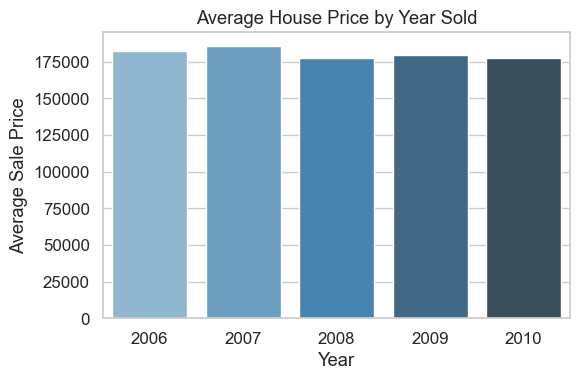

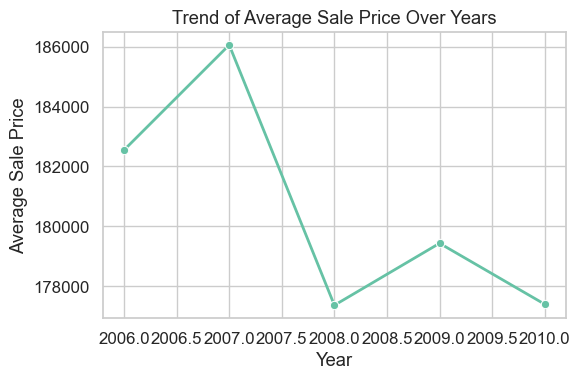

In [93]:
# ---------- 1. Average Sale Price by Year ----------
plt.figure(figsize=(6, 4))
sns.barplot(x='YrSold', y='SalePrice', data=df, ci=None, palette="Blues_d")
plt.title("Average House Price by Year Sold")
plt.ylabel("Average Sale Price")
plt.xlabel("Year")
plt.tight_layout()
plt.show()

# ---------- 2. Yearly Trend Line (Optional: Add Rolling Avg) ----------
yearly_avg = df.groupby('YrSold')['SalePrice'].mean().reset_index()

plt.figure(figsize=(6, 4))
sns.lineplot(data=yearly_avg, x='YrSold', y='SalePrice', marker='o', linewidth=2)
plt.title("Trend of Average Sale Price Over Years")
plt.ylabel("Average Sale Price")
plt.xlabel("Year")
plt.tight_layout()
plt.show()


### 9.Customer Preferences and Amenities

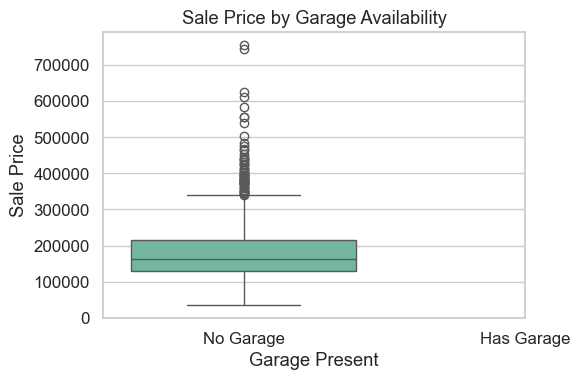

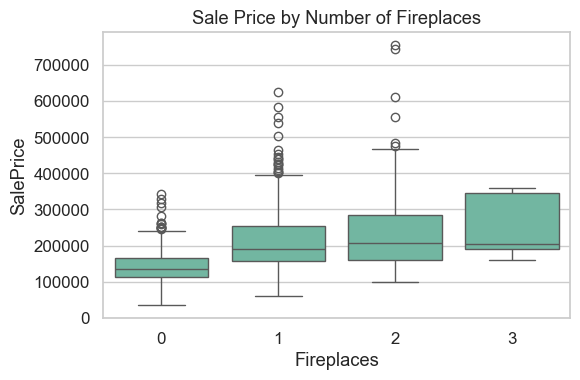

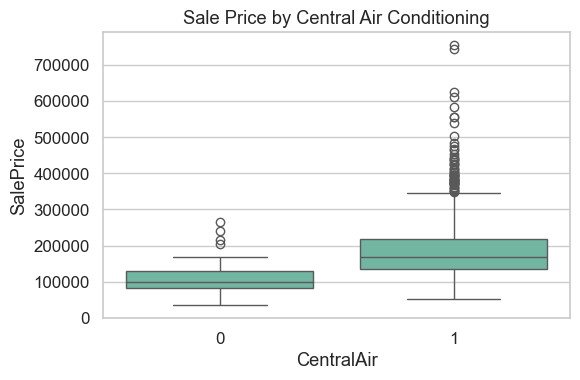

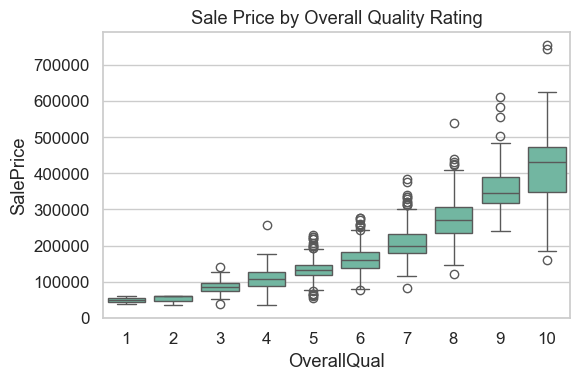

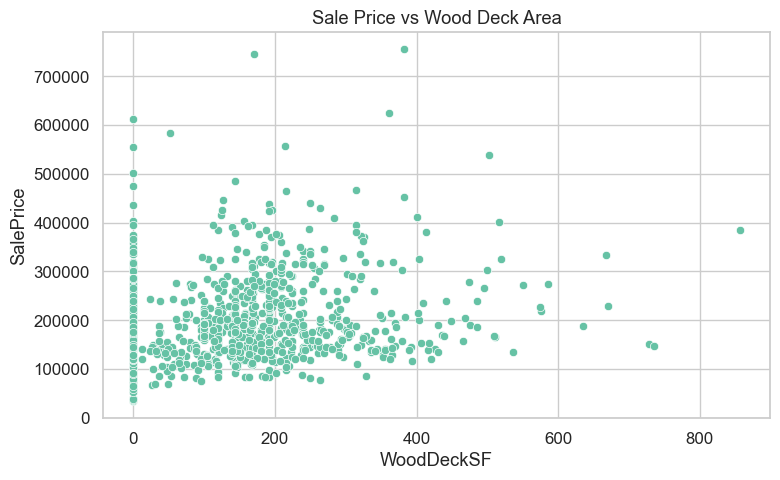

In [94]:
# ---------- 1. Garage Presence vs SalePrice ----------
plt.figure(figsize=(6, 4))
sns.boxplot(x=df['GarageType'].notna(), y=df['SalePrice'])
plt.xticks([0, 1], ['No Garage', 'Has Garage'])
plt.title("Sale Price by Garage Availability")
plt.ylabel("Sale Price")
plt.xlabel("Garage Present")
plt.tight_layout()
plt.show()

# ---------- 2. Fireplace Count vs SalePrice ----------
plt.figure(figsize=(6, 4))
sns.boxplot(x='Fireplaces', y='SalePrice', data=df)
plt.title("Sale Price by Number of Fireplaces")
plt.tight_layout()
plt.show()

# ---------- 3. Central Air vs SalePrice ----------
plt.figure(figsize=(6, 4))
sns.boxplot(x='CentralAir', y='SalePrice', data=df)
plt.title("Sale Price by Central Air Conditioning")
plt.tight_layout()
plt.show()

# ---------- 4. Overall Quality vs SalePrice ----------
plt.figure(figsize=(6, 4))
sns.boxplot(x='OverallQual', y='SalePrice', data=df)
plt.title("Sale Price by Overall Quality Rating")
plt.tight_layout()
plt.show()

# ---------- 5. Deck Area vs SalePrice ----------
plt.figure(figsize=(8, 5))
sns.scatterplot(x='WoodDeckSF', y='SalePrice', data=df)
plt.title("Sale Price vs Wood Deck Area")
plt.tight_layout()
plt.show()


### 10.Outliers Processing(Find and Removal)

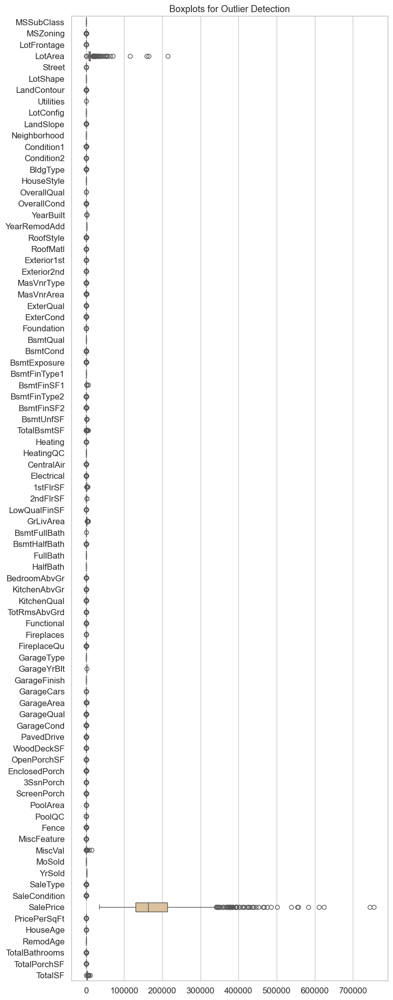

In [95]:
# Find Outliers 
plt.figure(figsize=(8,20))
sns.boxplot(data=df, orient='h', palette='Set2')
plt.title("Boxplots for Outlier Detection")
plt.tight_layout()
plt.show()

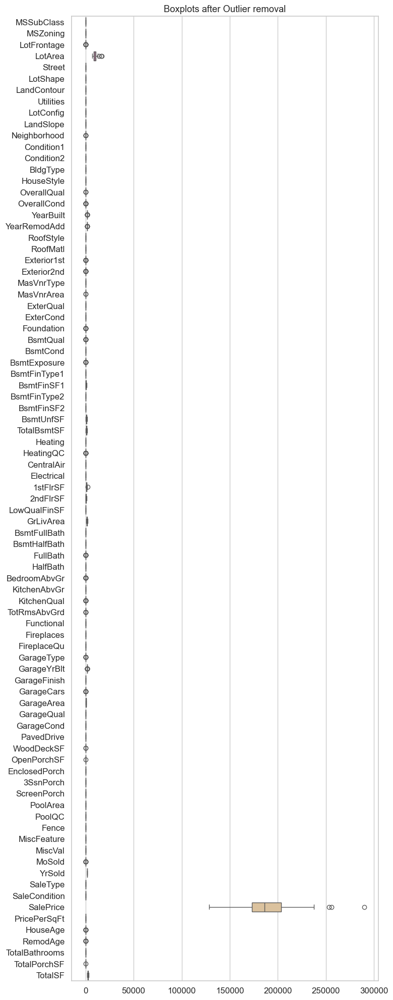

In [96]:
# Remove Outliers Using IQR
def remove_outliers_iqr(df):
    # Select only numeric columns
    numeric_df = df.select_dtypes(include='number')
    Q1 = numeric_df.quantile(0.25)
    Q3 = numeric_df.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return numeric_df[~((numeric_df < lower) | (numeric_df > upper)).any(axis=1)]

df1_clean = remove_outliers_iqr(df)
plt.figure(figsize=(8,20))
sns.boxplot(data=df1_clean, orient='h', palette='Set2')
plt.title("Boxplots after Outlier removal")
plt.tight_layout()
plt.show()

In [97]:
# Ensure numeric columns only
numeric_cols = df.select_dtypes(include='number')

# Calculate skewness and kurtosis
skew_kurt_df = pd.DataFrame({
    'Skewness': numeric_cols.apply(skew),
    'Kurtosis': numeric_cols.apply(kurtosis)
})

# Sort by absolute skew
skew_kurt_df['Abs_Skew'] = skew_kurt_df['Skewness'].abs()

# Classify skewness
def classify_skew(x):
    if abs(x) > 1:
        return 'Highly Skewed'
    elif abs(x) > 0.5:
        return 'Moderately Skewed'
    else:
        return 'Symmetric'

skew_kurt_df['Skew_Type'] = skew_kurt_df['Skewness'].apply(classify_skew)

# Print results
print(skew_kurt_df[['Skewness', 'Kurtosis', 'Skew_Type']])


                 Skewness    Kurtosis          Skew_Type
MSSubClass       0.259224   -0.674936          Symmetric
MSZoning        -1.733612    6.261557      Highly Skewed
LotFrontage      0.267547    3.594218          Symmetric
LotArea         12.195142  202.543793      Highly Skewed
Street         -15.502821  238.337460      Highly Skewed
...                   ...         ...                ...
HouseAge         0.608404   -0.439442  Moderately Skewed
RemodAge         0.501973   -1.265803  Moderately Skewed
TotalBathrooms   0.264404   -0.137350          Symmetric
TotalPorchSF     1.997973    7.246543      Highly Skewed
TotalSF          1.774874   12.574677      Highly Skewed

[85 rows x 3 columns]
